In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
def merge_main_holidays():
    #calls the main data frame
    project_id = "wagon-bootcamp-428814"
    query = """
    SELECT
        DATE(`Date`) AS Date_day,
        `Community Area`,
        COUNT(*) AS crime_count
    FROM
        `wagon-bootcamp-428814.chicago_crime.chicago_crime_tab`
    GROUP BY
        Date_day, `Community Area`
    ORDER BY
        Date_day, `Community Area`
    """
    df_main = pd.read_gbq(query, project_id=project_id, dialect='standard')
    #calls the holidays data frame
    query2 = """
    SELECT *
    FROM
        `wagon-bootcamp-428814.chicago_public_hols.chicago_public_hols`
    """
    df_holidays = pd.read_gbq(query2, project_id=project_id, dialect='standard')
    #creates a new column where if there's a holiday then we will have 1
    df_holidays['is_holiday'] = 1
    df_holidays = df_holidays.rename(columns={'Date': 'Date_day'})
    #merged the 2 data frames
    df_merged = df_main.merge(df_holidays[['Date_day', 'is_holiday']], on='Date_day', how='left')
    #fills with 0's the rest of the days the normal days
    df_merged['is_holiday'] = df_merged['is_holiday'].fillna(0).astype(int)
    #set's the Date_day as the index
    df_merged = df_merged.set_index('Date_day')
    df_merged.index=pd.to_datetime(df_merged.index)
    #create's the column day_of_week by name of the day
    df_merged['day_of_week'] = df_merged.index.day_name()
    #assigns the right number to the day of the week
    day_mapping = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
    }
    df_merged['day_of_week'] = df_merged['day_of_week'].map(day_mapping)
    return df_merged

In [3]:
df2=merge_main_holidays()
df2


,Community Area,crime_count,is_holiday,day_of_week
Date_day,,,,
2001-01-01,None,1464,1,0
2001-01-01,1,8,1,0
2001-01-01,10,1,1,0
2001-01-01,11,1,1,0
2001-01-01,12,1,1,0
...,...,...,...,...
2024-08-12,6,1,0,0
2024-08-12,68,1,0,0
2024-08-12,69,1,0,0


In [4]:
df25=df2[df2["Community Area"]=="25"].drop(columns=["Community Area"]).sort_values("Date_day")


In [5]:
ca25_df= df25[df25.index >= "2013-01-01"]

In [8]:
# transform weekdays into cyclical features:

ca25_df["wd_cos"] = np.cos(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )
ca25_df["wd_sin"] = np.sin(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )

<ipython-input-8-80ac7103dcaf>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ca25_df["wd_cos"] = np.cos(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )
<ipython-input-8-80ac7103dcaf>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ca25_df["wd_sin"] = np.sin(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )


In [11]:
ca25_df.head(1)

,crime_count,is_holiday,day_of_week,wd_cos,wd_sin
Date_day,,,,,
2013-01-01,107,1,1,0.62349,0.781831


In [13]:
# Feature lists

crime_count_list = list(ca25_df["crime_count"])
holiday_list = list(ca25_df["is_holiday"])
wd_cos_list = list(ca25_df["wd_cos"])
wd_sin_list = list(ca25_df["wd_sin"])

sequence_length = 365  # this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                holiday_list[i-sequence_length:i],
                                wd_cos_list[i-sequence_length:i],
                                wd_sin_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

from sklearn.model_selection import train_test_split

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [15]:
# Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

crime_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [35]:
# NN Architecture and Initialization:

from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error

def init_model(n_features,learning_rate=0.001):
  model = Sequential()

  model.add(layers.Conv1D( filters=64, kernel_size=90, input_shape=(365, n_features) ) )
  #model.add(Dropout(0.1))

  model.add(layers.GRU(units=16, activation='relu'
                      #, return_sequences=True
                      ))
  #model.add(Dropout(0.2))

  #model.add(layers.Dense(20, activation="relu"))
  model.add(layers.Dense(16, activation="relu"))
  model.add(layers.Dense(1, activation="linear"))

  # 2- Compilation
  model.compile(loss='mae',
                optimizer=Adam(learning_rate=learning_rate))

  # 3- ES
  #es = EarlyStopping(patience=0, restore_best_weights=True)
  print(model.summary())
  return model

In [20]:
model=init_model()

history=model.fit(X_train, y_train, epochs=10, verbose=0, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

Epoch 1/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 20.2489 - val_loss: 7.6820
Epoch 2/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 7.0559 - val_loss: 7.3004
Epoch 3/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 6.6112 - val_loss: 6.0905
Epoch 4/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 38s 140ms/step - loss: 6.3427 - val_loss: 6.2096
Epoch 5/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 6.4270 - val_loss: 5.8961
Epoch 6/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 6.5702 - val_loss: 5.8979
Epoch 7/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 21s 141ms/step - loss: 6.5776 - val_loss: 6.0141
Epoch 8/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 6.2126 - val_loss: 5.7880
Epoch 9/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 6.3629 - val_loss: 5.8070
Epoch 10/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 6.1956 - val_loss: 5.9205


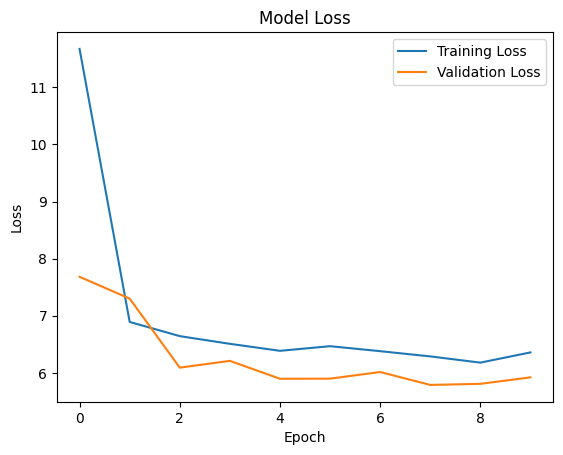

In [21]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [22]:
y_pred=model.predict(X_test)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step


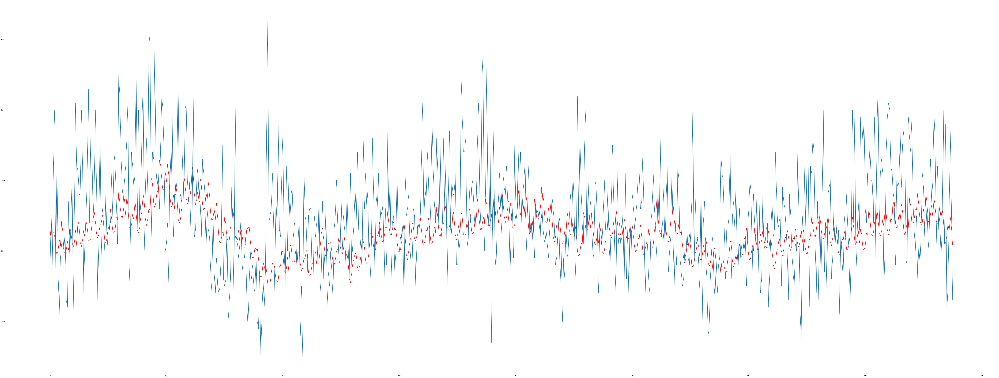

In [23]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [24]:
mean_absolute_error(y_test, y_pred)

6.139357500469561

**NOW ONLY DAY OF WEEK:**

In [25]:
# Feature lists

crime_count_list = list(ca25_df["crime_count"])
wd_cos_list = list(ca25_df["wd_cos"])
wd_sin_list = list(ca25_df["wd_sin"])

sequence_length = 365  # this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                wd_cos_list[i-sequence_length:i],
                                wd_sin_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

from sklearn.model_selection import train_test_split

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [26]:
# Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

crime_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [36]:
model=init_model(3,0.01)

history=model.fit(X_train, y_train, epochs=10, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)                    │ (None, 276, 64)             │          17,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_4 (GRU)                          │ (None, 16)                  │           3,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,569 (84.25 KB)

 Trainable params: 21,569 (84.25 KB)

 Non-trainable params: 0 (0.00 B)

None


In [37]:
y_pred=model.predict(X_test)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step


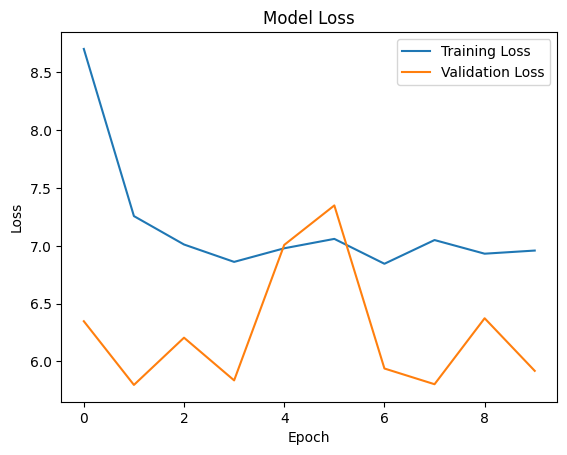

In [38]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

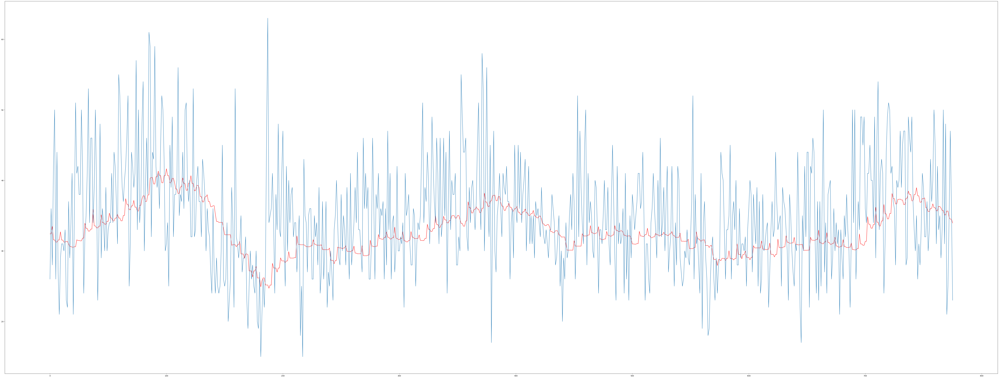

In [39]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [40]:
mean_absolute_error(y_test, y_pred)

6.000985595368848

slight improvement by setting learning rate from 0.001 to 0.01 (Explore further!)

**DAY OF THE MONTH**

In [42]:
df2['day'] = pd.to_datetime(df2.index)
df2['day_number'] = df2['day'].dt.day

,Community Area,crime_count,is_holiday,day_of_week,day,day_number
Date_day,,,,,,
2001-01-01,None,1464,1,0,2001-01-01,1
2001-01-01,1,8,1,0,2001-01-01,1
2001-01-01,10,1,1,0,2001-01-01,1
2001-01-01,11,1,1,0,2001-01-01,1
2001-01-01,12,1,1,0,2001-01-01,1
...,...,...,...,...,...,...
2024-08-12,6,1,0,0,2024-08-12,12
2024-08-12,68,1,0,0,2024-08-12,12
2024-08-12,69,1,0,0,2024-08-12,12


In [43]:
df25=df2[df2["Community Area"]=="25"].drop(columns=["Community Area"]).sort_values("Date_day")


In [46]:
ca25_df= df25[df25.index >= "2013-01-01"].copy()

In [47]:
# transform weekdays and dayofmonth into cyclical features:

ca25_df["wd_cos"] = np.cos(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )
ca25_df["wd_sin"] = np.sin(ca25_df["day_of_week"] * 2.0 * np.pi / 7.0 )

ca25_df["md_cos"] = np.cos(ca25_df["day_number"] * 2.0 * np.pi / 31.0 )
ca25_df["md_sin"] = np.sin(ca25_df["day_number"] * 2.0 * np.pi / 31.0 )

In [48]:
ca25_df.head(1)

,crime_count,is_holiday,day_of_week,day,day_number,wd_cos,wd_sin,md_cos,md_sin
Date_day,,,,,,,,,
2013-01-01,107,1,1,2013-01-01,1,0.62349,0.781831,0.97953,0.201299


In [49]:
# Feature lists

crime_count_list = list(ca25_df["crime_count"])
#holiday_list = list(ca25_df["is_holiday"])
wd_cos_list = list(ca25_df["wd_cos"])
wd_sin_list = list(ca25_df["wd_sin"])
md_cos_list = list(ca25_df["md_cos"])
md_sin_list = list(ca25_df["md_sin"])

sequence_length = 365  # this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                #holiday_list[i-sequence_length:i],
                                wd_cos_list[i-sequence_length:i],
                                wd_sin_list[i-sequence_length:i],
                                md_cos_list[i-sequence_length:i],
                                md_sin_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

from sklearn.model_selection import train_test_split

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [50]:
# Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

crime_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [56]:
model=init_model(5,0.001)

history=model.fit(X_train, y_train, epochs=10, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_7 (Conv1D)                    │ (None, 276, 64)             │          28,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_7 (GRU)                          │ (None, 16)                  │           3,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,089 (129.25 KB)

 Trainable params: 33,089 (129.25 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 30s 181ms/step - loss: 19.3704 - val_loss: 6.3787
Epoch 2/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 49s 238ms/step - loss: 7.4277 - val_loss: 6.0205
Epoch 3/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 21s 142ms/step - loss: 7.0025 - val_loss: 6.4879
Epoch 4/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 6.8575 - val_loss: 6.7229
Epoch 5/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 6.6385 - val_loss: 6.2218
Epoch 6/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 6.7034 - val_loss: 6.1907
Epoch 7/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 6.3783 - val_loss: 5.9485
Epoch 8/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 25s 171ms/step - loss: 6.4797 - val_loss: 5.9517
Epoch 9/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 6.8391 - val_loss: 6.4394
Epoch 10/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 6.5615 - val_loss: 6.0320


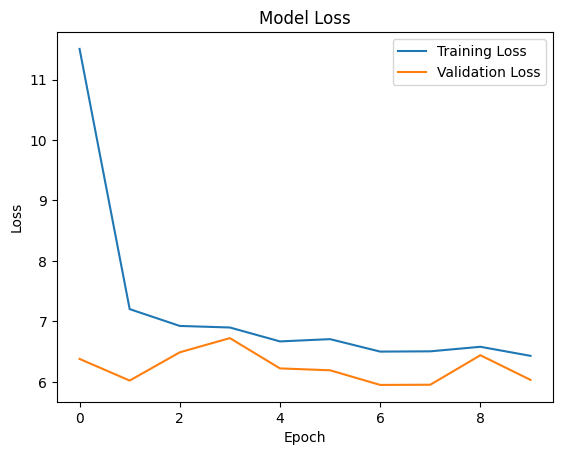

In [57]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [58]:
y_pred=model.predict(X_test)
mean_absolute_error(y_test, y_pred)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step


6.028350316372114

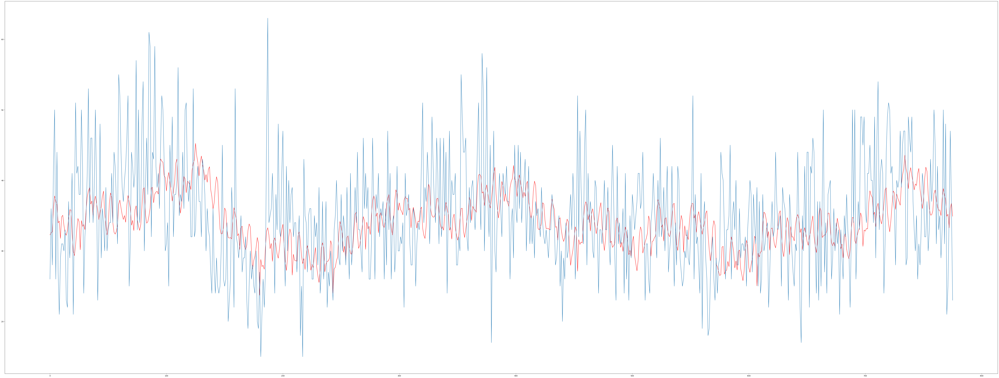

In [59]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

QUICK INTERLUDE...

In [70]:
ca25_df.head(1)

,crime_count,is_holiday,day_of_week,day,day_number,wd_cos,wd_sin,md_cos,md_sin
Date_day,,,,,,,,,
2013-01-01,107,1,1,2013-01-01,1,0.62349,0.781831,0.97953,0.201299


<Axes: xlabel='Date_day'>

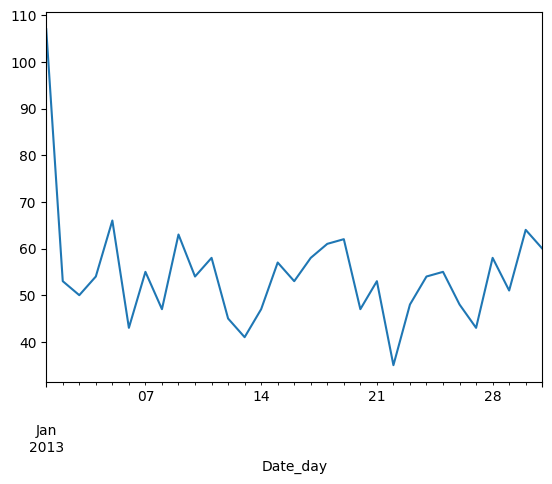

In [77]:
a_df=ca25_df.copy()
pd.to_datetime(a_df.index)
a_df["2013-01-01":"2013-01-31"]["crime_count"].plot()

NOW ONLY DAY OF MONTH:

In [78]:
# Feature lists

crime_count_list = list(ca25_df["crime_count"])
#holiday_list = list(ca25_df["is_holiday"])
#wd_cos_list = list(ca25_df["wd_cos"])
#wd_sin_list = list(ca25_df["wd_sin"])
md_cos_list = list(ca25_df["md_cos"])
md_sin_list = list(ca25_df["md_sin"])

sequence_length = 365  # this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                #holiday_list[i-sequence_length:i],
                                #wd_cos_list[i-sequence_length:i],
                                #wd_sin_list[i-sequence_length:i],
                                md_cos_list[i-sequence_length:i],
                                md_sin_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

from sklearn.model_selection import train_test_split

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [79]:
# Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

crime_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [80]:
model=init_model(3,0.001)

history=model.fit(X_train, y_train, epochs=10, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)                    │ (None, 276, 64)             │          17,344 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_8 (GRU)                          │ (None, 16)                  │           3,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,569 (84.25 KB)

 Trainable params: 21,569 (84.25 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 28s 171ms/step - loss: 23.5943 - val_loss: 9.1923
Epoch 2/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 7.3043 - val_loss: 7.2097
Epoch 3/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 6.9348 - val_loss: 5.8220
Epoch 4/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 6.5883 - val_loss: 6.2146
Epoch 5/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 6.7905 - val_loss: 5.7434
Epoch 6/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 6.7507 - val_loss: 5.8688
Epoch 7/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 6.6884 - val_loss: 5.7836
Epoch 8/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 6.5802 - val_loss: 5.9304
Epoch 9/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 6.1495 - val_loss: 5.9869
Epoch 10/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 6.2300 - val_loss: 5.7336


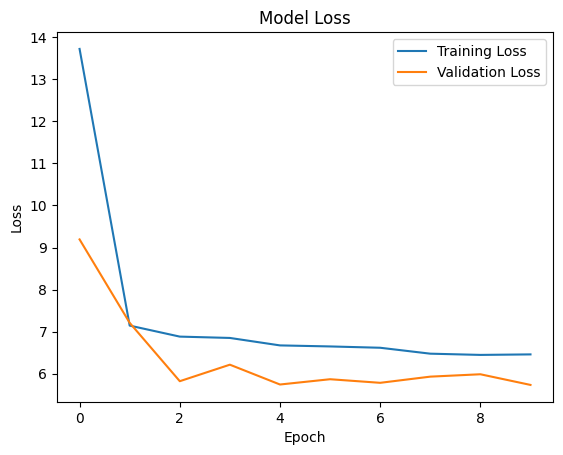

In [81]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [82]:
y_pred=model.predict(X_test)
mean_absolute_error(y_test, y_pred)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step


5.940874406971882

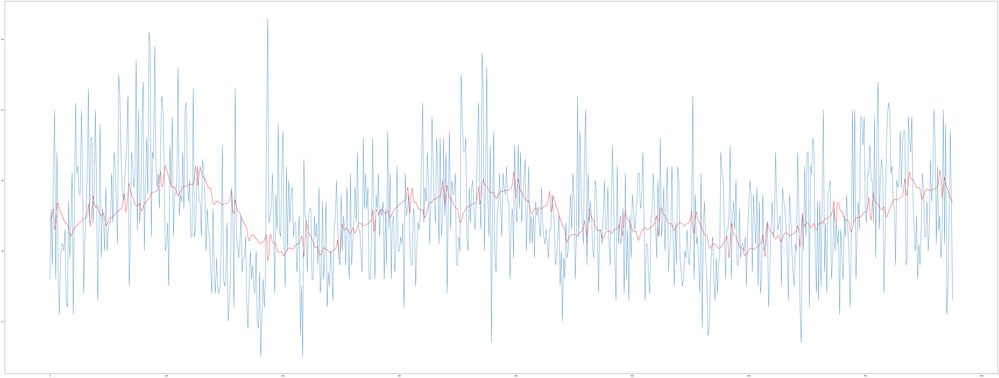

In [83]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

COMPARE WITH PURE MODEL:

In [84]:
# Feature lists

crime_count_list = list(ca25_df["crime_count"])

sequence_length = 365  # this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    X.append(crime_count_list[i-sequence_length:i])
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

from sklearn.model_selection import train_test_split

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [85]:
# Scaling

from sklearn.preprocessing import MinMaxScaler, StandardScaler

crime_scaler = MinMaxScaler()

# Fit the scalers on the training data
crime_scaler.fit(X_train)

# Transform the training data
X_train = crime_scaler.transform(X_train)
X_val = crime_scaler.transform(X_val)
X_test = crime_scaler.transform(X_test)


In [86]:
model=init_model(1,0.001)

history=model.fit(X_train, y_train, epochs=10, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_9 (Conv1D)                    │ (None, 276, 64)             │           5,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_9 (GRU)                          │ (None, 16)                  │           3,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,049 (39.25 KB)

 Trainable params: 10,049 (39.25 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 25s 140ms/step - loss: 34.0790 - val_loss: 9.0470
Epoch 2/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 137ms/step - loss: 7.1914 - val_loss: 8.0033
Epoch 3/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 6.9508 - val_loss: 7.5935
Epoch 4/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 6.7297 - val_loss: 7.1168
Epoch 5/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 138ms/step - loss: 6.4266 - val_loss: 6.4637
Epoch 6/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 6.4315 - val_loss: 6.1638
Epoch 7/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 6.2883 - val_loss: 6.6162
Epoch 8/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 20s 135ms/step - loss: 6.5073 - val_loss: 5.8954
Epoch 9/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 6.3633 - val_loss: 5.9293
Epoch 10/10
146/146 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 6.0218 - val_loss: 5.7868


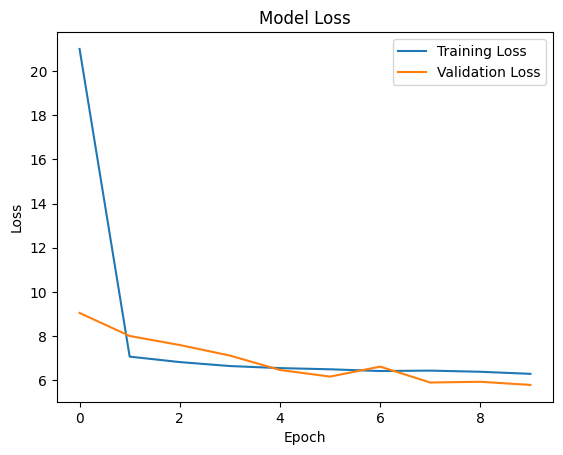

In [87]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [88]:
y_pred=model.predict(X_test)
mean_absolute_error(y_test, y_pred)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step


5.859959491749399

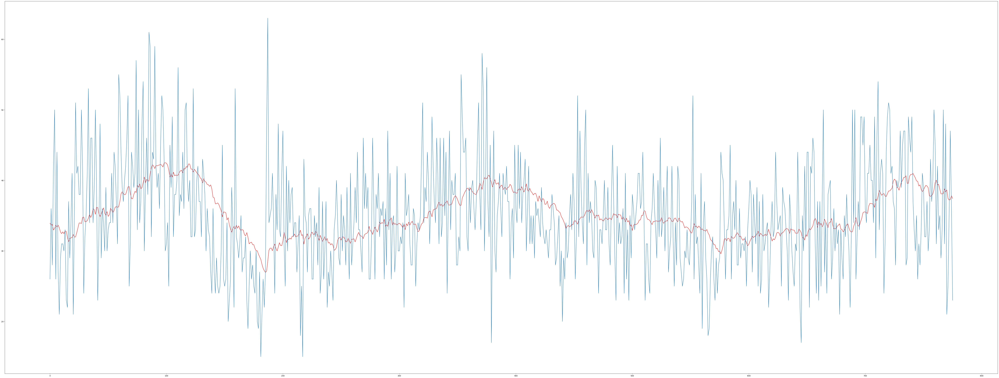

In [89]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

<Axes: xlabel='Date_day'>

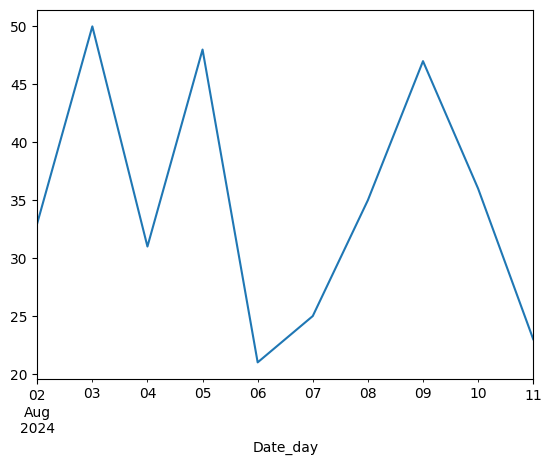

In [100]:
ca25_df["crime_count"].tail(10).plot()

0.23640661938534277